In [1]:
using Plots
gr(fmt = :png)
using LaTeXStrings
using Measures
pyplot()

┌ Warning: `getindex(o::PyObject, s::AbstractString)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o."s"` instead of `o["s"]`.
│   caller = top-level scope at none:0
└ @ Core none:0


Plots.PyPlotBackend()

In [2]:
function potential(x::Complex, H::Float64)
    y = sqrt(x^2-H^2*x^4)
end

potential (generic function with 1 method)

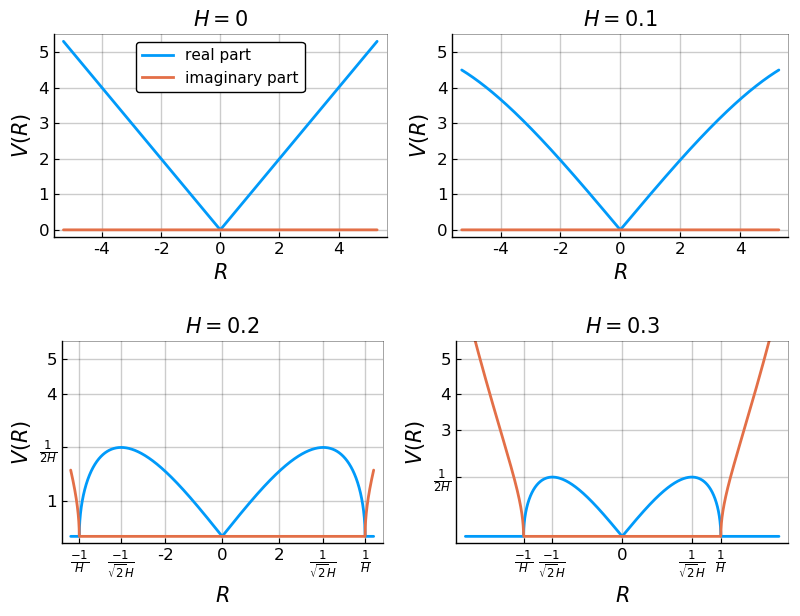

┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(o::PyObject, s::Symbol)` is deprecated in favor of dot overloading (`getproperty`) so elements should now be accessed as e.g. `o.s` instead of `o[:s]`.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332
┌ Warning: `getindex(f::Figure, x)` is deprecated, use `getproperty(f, x)` instead.
│   caller = _show(::IOStream, ::MIME{Symbol("application/pdf")}, ::Plots.Plot{Plots.PyPlotBackend}) at pyplot.jl:1332
└ @ Plots C:\Users\Vojta\.julia\packages\Plots\ex9On\src\backends\pyplot.jl:1332


In [20]:
x = -5.3:0.001:5.3
H1 = 0.0
H2 = 0.1
H3 = 0.2
H4 = 0.3
y1 = potential.(Complex.(x), H1)
y2 = potential.(Complex.(x), H2)
y3 = potential.(Complex.(x), H3)
y4 = potential.(Complex.(x), H4)


p1 = plot(x,real.(y1), label = "real part", title =  latexstring("H = 0 ~ \\rm{(flat ~ spacetime)}"), legend = :top, linewidth = 2)
plot!(x,imag.(y1), label = "imaginary part", linewidth = 2, ylabel = L"V(R)", xlabel = L"R", ylimits = (-0.2, 5.5), legendfontsize = 11)

p2 = plot(x,real.(y2), title = latexstring("H = $(H2)"), legend = :none, linewidth = 2)
plot!(x,imag.(y2), linewidth = 2, ylabel = L"V(R)", xlabel = L"R", ylimits = (-0.2, 5.5), legend = :none)

p3 = plot(x,real.(y3), label = "real part", title = latexstring("H = $(H3)"), legend = :none, linewidth = 2,
    xticks = ([-1/H3, -1/(sqrt(2)*H3), -2.0, 0.0, 2.0, 1/(sqrt(2)*H3), 1/H3], [L"\frac{-1}{H}", L"\frac{-1}{\sqrt{2} H}", "-2", "0", "2", L"\frac{1}{\sqrt{2} H}", L"\frac{1}{H}"]),
    yticks = ([1, 1/(2*H3), 4, 5], [1, L"\frac{1}{2H}", 4, 5]))
plot!(x,imag.(y3), label = "imaginary part", linewidth = 2, ylabel = L"V(R)", xlabel = L"R", ylimits = (-0.2, 5.5))

p4 = plot(x,real.(y4), title =  latexstring("H = $(H4)"), legend = :none, linewidth = 2,
    xticks = ([-1/H4, -1/(sqrt(2)*H4), 0.0, 1/(sqrt(2)*H4), 1/H4], [L"\frac{-1}{H}", L"\frac{-1}{\sqrt{2} H}", "0", L"\frac{1}{\sqrt{2} H}", L"\frac{1}{H}"]),
    yticks = ([1/(2*H4), 3, 4, 5], [L"\frac{1}{2H}", 3, 4, 5]))
plot!(x,imag.(y4), linewidth = 2, ylabel = L"V(R)", xlabel = L"R", ylimits = (-0.2, 5.5), legend = :none)

p5 = plot(legend=false,grid=false,foreground_color_subplot=:white)

l = @layout [ a{1.0h} b{1.0h}  
    e{0.001h}
c{1.0h} d{1.0h}]

pp = plot(p1, p2, p5, p3, p4, layout = l, size = (800, 600), framestyle = :semi, 
    tickfontsize = 12, gridalpha = 0.2, gridlinewidth = 1.0, guidefontsize = 15, titlefontsize = 15, left_margin = 0.5cm)
#savefig(pp, "potential.pdf")